In [1]:
pwd

'/mmfs1/data/aglinska/BC-MRI-AE/misc/jacobian_pca'

In [2]:
import numpy as np 
import pandas as pd
import ants

from tqdm import tqdm
from umap import UMAP
from matplotlib import pyplot as plt
from scipy.stats import pearsonr,spearmanr,kendalltau
from datetime import datetime;now = datetime.now
print(now())

2022-02-08 12:33:11.560974


In [3]:
df = pd.read_csv('../../Data/ABIDE_legend_S982.csv')
patients = df['DxGroup'].values==1
df_asd = df.iloc[patients]

In [4]:
subs = df_asd['BIDS_ID'].values

In [5]:
fn_temp = '../../../jacobians/normed_Js_masked/{}_normed_Js_masked.nii'

In [6]:
ims = [ants.image_read(fn_temp.format(sub)) for sub in tqdm(subs)]

100%|██████████| 470/470 [00:08<00:00, 52.56it/s]


In [7]:
flatmap = np.array([im.numpy().flatten() for im in ims]) 
evox = ((flatmap**2).sum(axis=0)!=0)
flatmap = flatmap[:,evox] # only analyze voxels with values > 0
flatmap = flatmap-flatmap.mean(axis=0) # center each voxel at zero
#flatmap = flatmap-flatmap.mean(axis=1)[:,np.newaxis] # center each subject at zero
flatmap.shape

(470, 55432)

## OVERALL PCA

In [8]:
from sklearn.decomposition import PCA
reducer = PCA()
reducer.fit(flatmap)
j_pca_all = reducer.transform(flatmap)

In [9]:
# Components needed to explain %90 of variance
print((np.cumsum(reducer.explained_variance_ratio_)<.9).sum())

103


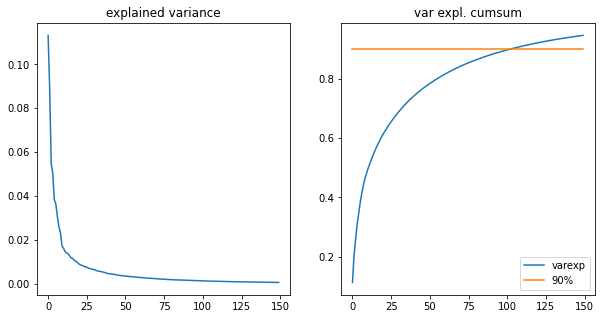

In [10]:
nplot = 150
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.plot(reducer.explained_variance_ratio_[0:nplot])
plt.title('explained variance')
plt.subplot(1,2,2)
plt.plot(np.cumsum(reducer.explained_variance_ratio_[0:nplot]))
plt.plot(np.arange(nplot),np.repeat(.9,nplot))
plt.title('var expl. cumsum')
plt.legend(['varexp','90%'])

In [11]:
# LOSO PCA
est_pca = False
if est_pca:
    ns = flatmap.shape[0]
    j_pca_loso = np.array([PCA().fit(flatmap[np.arange(ns)!=s]).transform(flatmap[s,:][np.newaxis,:]) for s in tqdm(range(ns))])
    np.save(file='../../Data/j_pca_loso.npy',arr=j_pca_loso)
else:
    j_pca_loso = np.load('../../Data/j_pca_loso.npy')

j_pca_loso_2 = j_pca_loso[:,0,0:2]

In [12]:
j_pca = j_pca_loso_2

In [13]:
#j_pca = UMAP(n_components=2).fit_transform(flatmap)

In [14]:
#from scipy.stats import pearsonr
corr = kendalltau

In [15]:
jacobians_flat = np.array([im.numpy().flatten() for im in ims])

In [16]:
# DO X AXIS
res = np.array([corr(jacobians_flat[:,v],j_pca[:,0]) for v in tqdm(range(jacobians_flat.shape[1]))])
xcorr_r = res[:,0]
xcorr_p = res[:,1]

100%|██████████| 262144/262144 [00:51<00:00, 5080.96it/s]


In [17]:
# DO Y AXIS
res = np.array([corr(jacobians_flat[:,v],j_pca[:,1]) for v in tqdm(range(jacobians_flat.shape[1]))])
ycorr_r = res[:,0]
ycorr_p = res[:,1]

100%|██████████| 262144/262144 [00:51<00:00, 5068.99it/s]


In [18]:
# Runtime warning when correlating zero voxels, can ignore
#xcorr = np.array([np.corrcoef(jacobians_flat[:,v],j_pca[:,0])[0,1] for v in tqdm(range(jacobians_flat.shape[1]))])
#ycorr = np.array([np.corrcoef(jacobians_flat[:,v],j_pca[:,1])[0,1] for v in tqdm(range(jacobians_flat.shape[1]))])

In [19]:
# BONF CORRECT MAPS
xcorr_r_threshed = xcorr_r.copy()
ycorr_r_threshed = ycorr_r.copy()

p_thresh = .05/(~np.isnan(xcorr_p)).sum()

xcorr_r_threshed[xcorr_p>p_thresh]=np.nan
ycorr_r_threshed[ycorr_p>p_thresh]=np.nan

In [20]:
print((abs(xcorr_r_threshed[xcorr_p<p_thresh])).min())
print((abs(ycorr_r_threshed[ycorr_p<p_thresh])).min())

0.15162183005942928
0.15161344469350177


In [21]:
# plt.hist(xcorr_r_threshed[xcorr_p<p_thresh])
# plt.hist(ycorr_r_threshed[ycorr_p<p_thresh])

In [22]:
temp = ants.image_read('single_subj_T1.nii')
temp = temp.resample_image(resample_params=(64,64,64), use_voxels=True, interp_type=1)

In [23]:
xcorr_nii = ims[0].new_image_like(xcorr_r_threshed.reshape((64,64,64))) #.plot_ortho(flat=True,black_bg=True,cmap='bwr')
ycorr_nii = ims[0].new_image_like(ycorr_r_threshed.reshape((64,64,64))) #.plot_ortho(flat=True,black_bg=True,cmap='bwr')

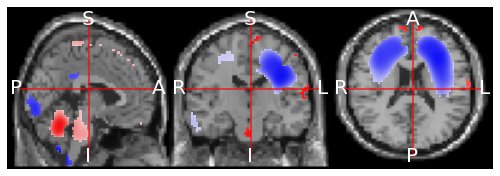

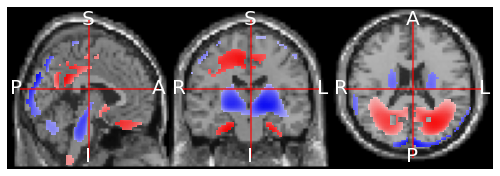

In [24]:
temp.plot_ortho(xcorr_nii,flat=True,black_bg=True,cmap='gray',overlay_cmap='bwr')
temp.plot_ortho(ycorr_nii,flat=True,black_bg=True,cmap='gray',overlay_cmap='bwr')

In [25]:
ycorr_r_threshed[np.isnan(ycorr_r_threshed)]=0
xcorr_r_threshed[np.isnan(xcorr_r_threshed)]=0

ims[0].new_image_like(xcorr_r.reshape((64,64,64))).to_filename('xcorr.nii')
ims[0].new_image_like(ycorr_r.reshape((64,64,64))).to_filename('ycorr.nii')

ims[0].new_image_like(xcorr_r_threshed.reshape((64,64,64))).to_filename('xcorr-bonf.nii')
ims[0].new_image_like(ycorr_r_threshed.reshape((64,64,64))).to_filename('ycorr-bonf.nii')

In [26]:
print(np.nanmin(xcorr_r).round(3),np.nanmean(xcorr_r).round(3),np.nanmax(xcorr_r).round(3))
print(np.nanmin(ycorr_r).round(3),np.nanmean(ycorr_r).round(3),np.nanmax(ycorr_r).round(3))

-0.521 -0.045 0.585
-0.453 0.005 0.577


## CORRELATE PCA W/ SYMPTOMS

In [27]:
# CORR PCA W/ SYMOTOMS
corr = pearsonr
corr = kendalltau

keys = ['AgeAtScan','FIQ','ADOS_Comm', 'ADOS_Social', 'ADOS_StBeh','ADI_R_SocialTotal', 'ADI_R_VerbalTotal', 'ADI_R_RRB','ADI_R_Onset Total']
npcs = 2 # How many PCs
# Make dataframe
col1 = list()
col2 = list()
for key in keys:
    for i in ['r','p']:
        col1.append(key)
        col2.append(i)
#columns = [[key,key],['r','p']]
columns = [col1,col2]
res_corr = pd.DataFrame(np.zeros((npcs,len(col1))),columns=columns)

for key in keys:
    for pc in range(npcs):
        vec_behav = df[key].values[patients]
        #vec_pca = j_pca_loso[:,0,pc]
        vec_pca = j_pca[:,pc]
        e = np.isnan(vec_behav)
        r,p = corr(vec_behav[~e],vec_pca[~e])
        res_corr.loc[pc].at[(key,'r')] = r
        res_corr.loc[pc].at[(key,'p')] = p
        #res_corr.loc[pc].at[(key,'n')] = len(vec_behav[~e])

In [28]:
pd.options.display.max_columns = None
res_corr

AgeAtScan                 FIQ           ADOS_Comm           ADOS_Social  \
          r         p         r         p         r         p           r   
0  0.057140  0.064370  0.004525  0.889681  0.092896  0.017455    0.056288   
1  0.043463  0.159456  0.016245  0.618488  0.080827  0.038626   -0.042589   

            ADOS_StBeh           ADI_R_SocialTotal            \
          p          r         p                 r         p   
0  0.136015   0.098143  0.023156          0.042289  0.278463   
1  0.259333  -0.061405  0.155377         -0.023770  0.542405   

  ADI_R_VerbalTotal           ADI_R_RRB           ADI_R_Onset Total            
                  r         p         r         p                 r         p  
0          0.007433  0.849078 -0.043311  0.279294          0.021979  0.618564  
1          0.025932  0.506788 -0.010662  0.789983         -0.006015  0.891613

In [29]:
for pc in range(res_corr.shape[0]):
    for key in keys:
        p = res_corr[key]['p'][pc]
        if p < .05:
            print('PC {} - {} | r = {:.3f},p = {:.3f}'.format(pc,key,res_corr[key]['r'][pc],res_corr[key]['p'][pc]))
            
            
            

PC 0 - ADOS_Comm | r = 0.093,p = 0.017
PC 0 - ADOS_StBeh | r = 0.098,p = 0.023
PC 1 - ADOS_Comm | r = 0.081,p = 0.039


## GENE CORR

In [228]:
import os
#gene_dir = '../../Data/gene_epression_maps/'
gene_dir = '../../Data/asd_genemaps2/'
genefiles = [genefile for genefile in os.listdir(gene_dir) if genefile.endswith('.nii.gz')]
genefiles.sort()
genefiles = np.array(genefiles)
#genelbls = [genefile.split('_')[1] for genefile in genefiles if genefile.endswith('.nii.gz')]
genelbls = np.array([genefile.replace('.nii.gz','') for genefile in genefiles])


#ord_ = np.array([0, 8, 6, 10, 5, 3, 11, 9, 4, 7, 1, 2])
#genefiles = genefiles[ord_]
ng = len(genefiles)
print(ng)
genefiles

42


array(['g1_CACNA1B.nii.gz', 'g1_CACNA1C.nii.gz', 'g1_CACNA1D.nii.gz',
       'g1_CACNA1E.nii.gz', 'g1_CACNA1G.nii.gz', 'g1_CACNA1H.nii.gz',
       'g1_CACNA1I.nii.gz', 'g1_CACNA1S.nii.gz', 'g1_CACNA2D1.nii.gz',
       'g2_SCN1A.nii.gz', 'g2_SCN2A.nii.gz', 'g2_SCN3A.nii.gz',
       'g2_SCN4A.nii.gz', 'g2_SCN5A.nii.gz', 'g3_KCNC1.nii.gz',
       'g3_KCND3.nii.gz', 'g3_KCNJ15.nii.gz', 'g3_KCNMA1.nii.gz',
       'g3_KCNQ3.nii.gz', 'g3_KCNS3.nii.gz', 'g3_KCTD20.nii.gz',
       'g3_KCTD3.nii.gz', 'g3_KCTD6.nii.gz', 'g4_CDH5.nii.gz',
       'g4_CHD1.nii.gz', 'g4_CHD2.nii.gz', 'g4_CHD3.nii.gz',
       'g4_CHD4.nii.gz', 'g4_CHD5.nii.gz', 'g4_CHD7.nii.gz',
       'g4_CHD8.nii.gz', 'g4_CHD9.nii.gz', 'g5_NLGN1.nii.gz',
       'g5_NLGN2.nii.gz', 'g5_NLGN3.nii.gz', 'g5_NRXN1.nii.gz',
       'g6_CDC73.nii.gz', 'g6_EPAS1.nii.gz', 'g6_JUP.nii.gz',
       'g6_LRRFIP1.nii.gz', 'g6_PTPRK.nii.gz', 'g6_SHANK2.nii.gz'],
      dtype='<U18')

In [229]:
#genemaps = [ants.image_read(os.path.join(gene_dir,genefile)) for genefile in genefiles]

In [230]:
#[genemaps[idx].to_filename(os.path.join('../../Data/asd_genemaps2/',genelbl+'.nii.gz')) for idx,genelbl in enumerate(genelbls)];

In [373]:
genemaps = [ants.image_read(os.path.join(gene_dir,genefile)) for genefile in genefiles]
genemaps = [genemap.resample_image(resample_params=(64,64,64), use_voxels=True, interp_type=1) for genemap in genemaps]

for i in range(ng):
    #pass
    genemaps[i][genemaps[i]<0]=0

In [305]:
xcorr_nii = ims[0].new_image_like(xcorr_r_threshed.reshape((64,64,64)))
ycorr_nii = ims[0].new_image_like(ycorr_r_threshed.reshape((64,64,64)))

In [306]:
genecorr_x = np.array([corr(genemap.flatten()[xcorr_nii.flatten()!=0],xcorr_nii.flatten()[xcorr_nii.flatten()!=0]) for genemap in genemaps])
genecorr_y = np.array([corr(genemap.flatten()[ycorr_nii.flatten()!=0],ycorr_nii.flatten()[ycorr_nii.flatten()!=0]) for genemap in genemaps])

In [307]:
# v1=genemaps[0].flatten()[xcorr_nii.flatten()!=0]
# v2=xcorr_nii.flatten()[xcorr_nii.flatten()!=0]
# slope, intercept, r_value, p_value, std_err = linregress(v1,v2)

def do_linreg(v1,v2):
    from scipy.stats import linregress
    slope, intercept, r_value, p_value, std_err = linregress(v1,v2)
    return (r_value,p_value)

In [308]:
xcorr_nii = ims[0].new_image_like(xcorr_r.reshape((64,64,64))) #.plot_ortho(flat=True,black_bg=True,cmap='bwr')
ycorr_nii = ims[0].new_image_like(ycorr_r.reshape((64,64,64))) #.plot_ortho(flat=True,black_bg=True,cmap='bwr')

genecorr_x = np.array([do_linreg(genemap.flatten()[~np.isnan(xcorr_nii.flatten())],xcorr_nii.flatten()[~np.isnan(xcorr_nii.flatten())]) for genemap in genemaps])
genecorr_y = np.array([do_linreg(genemap.flatten()[~np.isnan(ycorr_nii.flatten())],ycorr_nii.flatten()[~np.isnan(ycorr_nii.flatten())]) for genemap in genemaps])

columns = [['X','X','Y','Y'],['r','p','r','p']]
res_genecorr = pd.DataFrame(
    data=np.hstack((genecorr_x,genecorr_y)),
    columns=columns,index=genelbls)
res_genecorr.round(3)
#res_genecorr.sort_values(by=('X','r'),ascending=False).round(3)

X             Y       
                 r      p      r      p
g1_CACNA1B   0.055  0.000 -0.043  0.000
g1_CACNA1C   0.058  0.000 -0.030  0.000
g1_CACNA1D   0.053  0.000  0.007  0.108
g1_CACNA1E   0.029  0.000 -0.036  0.000
g1_CACNA1G   0.097  0.000 -0.103  0.000
g1_CACNA1H   0.073  0.000 -0.131  0.000
g1_CACNA1I   0.035  0.000 -0.047  0.000
g1_CACNA1S   0.046  0.000  0.024  0.000
g1_CACNA2D1  0.022  0.000  0.055  0.000
g2_SCN1A     0.118  0.000 -0.117  0.000
g2_SCN2A     0.076  0.000 -0.035  0.000
g2_SCN3A     0.036  0.000  0.012  0.006
g2_SCN4A     0.194  0.000 -0.083  0.000
g2_SCN5A     0.026  0.000 -0.011  0.012
g3_KCNC1     0.131  0.000 -0.157  0.000
g3_KCND3     0.093  0.000 -0.105  0.000
g3_KCNJ15    0.122  0.000 -0.055  0.000
g3_KCNMA1   -0.000  0.948  0.045  0.000
g3_KCNQ3     0.031  0.000 -0.082  0.000
g3_KCNS3     0.128  0.000 -0.107  0.000
g3_KCTD20    0.114  0.000 -0.123  0.000
g3_KCTD3     0.107  0.000 -0.175  0.000
g3_KCTD6     0.084  0.000 -0.095  0.000
g4_CDH5      0.089  0.000 -0.071  0.000
g4_CHD1      0.110  0.000 -0.130  0.000
g4_CHD2      0.129  0.000 -0.157  0.000
g4_CHD3      0.022  0.000  0.045  0.000
g4_CHD4      0.025  0.000 -0.131  0.000
g4_CHD5     -0.012  0.005  0.054  0.000
g4_CHD7      0.126  0.000 -0.156  0.000
g4_CHD8      0.063  0.000 -0.113  0.000
g4_CHD9      0.123  0.000 -0.136  0.000
g5_NLGN1     0.125  0.000 -0.052  0.000
g5_NLGN2     0.013  0.003 -0.031  0.000
g5_NLGN3     0.035  0.000 -0.057  0.000
g5_NRXN1     0.070  0.000  0.028  0.000
g6_CDC73     0.062  0.000 -0.133  0.000
g6_EPAS1     0.123  0.000 -0.165  0.000
g6_JUP       0.128  0.000 -0.166  0.000
g6_LRRFIP1   0.051  0.000  0.021  0.000
g6_PTPRK    -0.006  0.192 -0.005  0.238
g6_SHANK2    0.055  0.000  0.069  0.000

In [309]:
xcorr_nii = ims[0].new_image_like(xcorr_r.reshape((64,64,64))) #.plot_ortho(flat=True,black_bg=True,cmap='bwr')
ycorr_nii = ims[0].new_image_like(ycorr_r.reshape((64,64,64))) #.plot_ortho(flat=True,black_bg=True,cmap='bwr')

genecorr_x = np.array([corr(genemap.flatten()[~np.isnan(xcorr_nii.flatten())],xcorr_nii.flatten()[~np.isnan(xcorr_nii.flatten())]) for genemap in genemaps])
genecorr_y = np.array([corr(genemap.flatten()[~np.isnan(ycorr_nii.flatten())],ycorr_nii.flatten()[~np.isnan(ycorr_nii.flatten())]) for genemap in genemaps])

columns = [['X','X','Y','Y'],['r','p','r','p']]
res_genecorr = pd.DataFrame(
    data=np.hstack((genecorr_x,genecorr_y)),
    columns=columns,index=genelbls)
res_genecorr.sort_values(by=('X','r'),ascending=False).round(3)

X             Y       
                 r      p      r      p
g2_SCN4A     0.095  0.000 -0.045  0.000
g4_CHD2      0.083  0.000 -0.095  0.000
g2_SCN1A     0.071  0.000 -0.060  0.000
g3_KCNJ15    0.069  0.000 -0.035  0.000
g4_CHD7      0.065  0.000 -0.118  0.000
g3_KCNC1     0.064  0.000 -0.084  0.000
g6_JUP       0.061  0.000 -0.110  0.000
g5_NLGN1     0.060  0.000 -0.004  0.227
g4_CHD9      0.056  0.000 -0.090  0.000
g3_KCTD3     0.054  0.000 -0.105  0.000
g3_KCND3     0.051  0.000 -0.009  0.002
g1_CACNA1G   0.051  0.000 -0.034  0.000
g4_CHD1      0.049  0.000 -0.085  0.000
g3_KCNS3     0.049  0.000 -0.020  0.000
g1_CACNA1H   0.045  0.000 -0.033  0.000
g5_NRXN1     0.045  0.000  0.057  0.000
g3_KCTD20    0.043  0.000 -0.044  0.000
g1_CACNA1S   0.040  0.000  0.042  0.000
g1_CACNA1B   0.039  0.000 -0.008  0.007
g6_CDC73     0.036  0.000 -0.074  0.000
g1_CACNA1C   0.035  0.000  0.031  0.000
g4_CDH5      0.033  0.000 -0.047  0.000
g2_SCN2A     0.032  0.000  0.042  0.000
g6_LRRFIP1   0.031  0.000  0.048  0.000
g6_SHANK2    0.031  0.000  0.086  0.000
g1_CACNA1D   0.028  0.000  0.044  0.000
g3_KCNQ3     0.024  0.000 -0.001  0.782
g1_CACNA1E   0.019  0.000  0.043  0.000
g1_CACNA1I   0.017  0.000  0.010  0.001
g4_CHD8      0.017  0.000 -0.044  0.000
g3_KCTD6     0.016  0.000  0.005  0.082
g2_SCN3A     0.015  0.000  0.075  0.000
g6_EPAS1     0.014  0.000 -0.057  0.000
g5_NLGN3     0.008  0.011  0.021  0.000
g4_CHD4      0.005  0.072 -0.070  0.000
g4_CHD3      0.002  0.538  0.088  0.000
g5_NLGN2     0.002  0.554  0.032  0.000
g2_SCN5A     0.001  0.706  0.043  0.000
g1_CACNA2D1 -0.003  0.308  0.088  0.000
g6_PTPRK    -0.005  0.111  0.039  0.000
g3_KCNMA1   -0.006  0.043  0.079  0.000
g4_CHD5     -0.010  0.001  0.091  0.000

In [310]:
genes_flat = np.array([genemap.flatten()[evox] for genemap in genemaps])

In [311]:
X = genes_flat.transpose()
X = np.hstack((X,np.ones(X.shape[0])[:,np.newaxis])) # add const
y = xcorr_nii.flatten()[evox]
y = y.transpose()

xlbls = list(genelbls)
xlbls.append('intercept')
#xlbls = [xlbl.replace('gene_','') for xlbl in xlbls]
#xlbls = [xlbl.replace('.nii.gz','') for xlbl in xlbls]

print(X.shape)
print(y.shape)
results_x = sm.OLS(y, X).fit()
print(results_x.summary(xname=xlbls,title='xcorr'))

(55432, 43)
(55432,)
                                    xcorr                                     
Dep. Variable:                      y   R-squared:                       0.087
Model:                            OLS   Adj. R-squared:                  0.086
Method:                 Least Squares   F-statistic:                     125.4
Date:                Tue, 08 Feb 2022   Prob (F-statistic):               0.00
Time:                        13:43:49   Log-Likelihood:                 16544.
No. Observations:               55432   AIC:                        -3.300e+04
Df Residuals:                   55389   BIC:                        -3.262e+04
Df Model:                          42                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
g1_CACNA1B     -0.0030      0

In [312]:
X = genes_flat.transpose()
X = np.hstack((X,np.ones(X.shape[0])[:,np.newaxis])) # add const
y = ycorr_nii.flatten()[evox]
y = y.transpose()


xlbls = list(genelbls)
xlbls.append('intercept')
#xlbls = [xlbl.replace('gene_','') for xlbl in xlbls]
#xlbls = [xlbl.replace('.nii.gz','') for xlbl in xlbls]

print(X.shape)
print(y.shape)
results_y = sm.OLS(y, X).fit()
print(results_y.summary(xname=xlbls,title='ycorr'))

(55432, 43)
(55432,)
                                    ycorr                                     
Dep. Variable:                      y   R-squared:                       0.103
Model:                            OLS   Adj. R-squared:                  0.102
Method:                 Least Squares   F-statistic:                     151.2
Date:                Tue, 08 Feb 2022   Prob (F-statistic):               0.00
Time:                        13:43:49   Log-Likelihood:                 20298.
No. Observations:               55432   AIC:                        -4.051e+04
Df Residuals:                   55389   BIC:                        -4.013e+04
Df Model:                          42                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
g1_CACNA1B     -0.0038      0

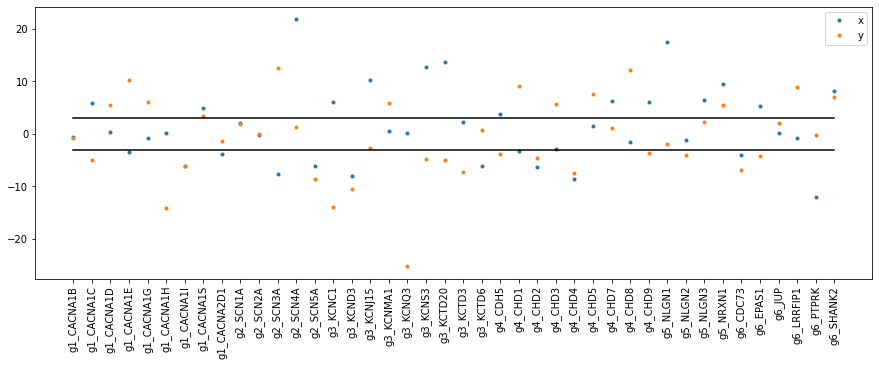

In [313]:
plt.figure(figsize=(15,5))
xs = np.arange(ng)
#xord = ord_
xord = xs
plt.plot(results_x.tvalues[0:-1][xord],'.')
plt.plot(results_y.tvalues[0:-1][xord],'.')
plt.plot(xs,np.repeat(3.1,ng),'k')
plt.plot(xs,np.repeat(-3.1,ng),'k')
plt.legend(['x','y'])

plt.xticks(xs,labels=np.array(genelbls)[xord],rotation=90);

##### 

In [314]:
# from sklearn.decomposition import FastICA
# transformer = FastICA(n_components=7,random_state=0)
# ica_res = transformer.fit_transform(flatmap)

(array([ 15., 105., 203., 195., 124.,  97.,  58.,  31.,  25.,   8.]),
 array([-0.24910645, -0.12999441, -0.01088236,  0.10822969,  0.22734174,
         0.34645379,  0.46556584,  0.58467789,  0.70378994,  0.82290198,
         0.94201403]),
 <BarContainer object of 10 artists>)

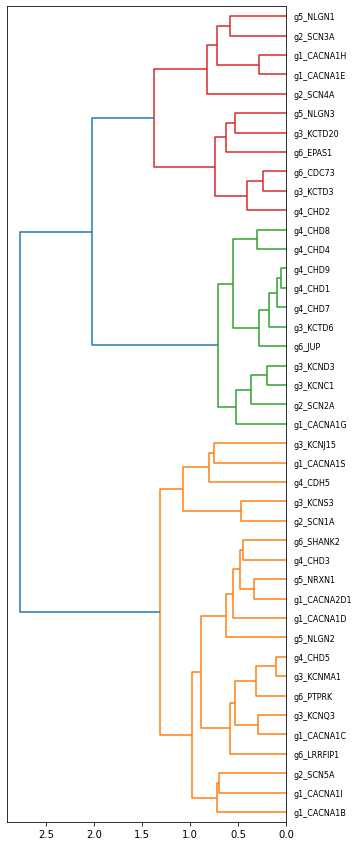

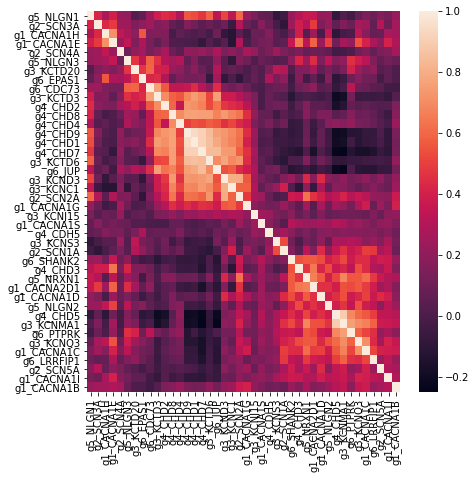

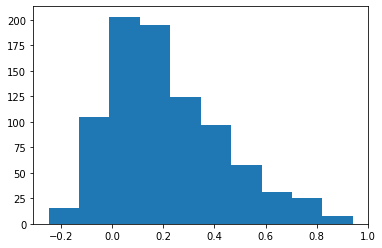

In [315]:
import seaborn as sns
from scipy.cluster.hierarchy import linkage,dendrogram
gcmat = np.corrcoef(genes_flat)
gcvec = gcmat[np.triu_indices(gcmat.shape[0],1)]


plt.figure(figsize=(5,15))
res = dendrogram(linkage(1-gcvec,'ward'),0,labels=genelbls,orientation='left')
ord_ = res['leaves'][::-1]

plt.figure(figsize=(7,7))
gcmat_ord = gcmat[ord_,:][:,ord_]
sns.heatmap(gcmat_ord,annot=False,xticklabels=genelbls[ord_],yticklabels=genelbls[ord_])

plt.figure()
plt.hist(gcvec)



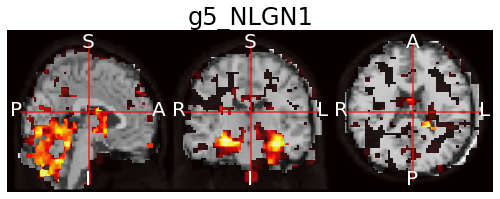

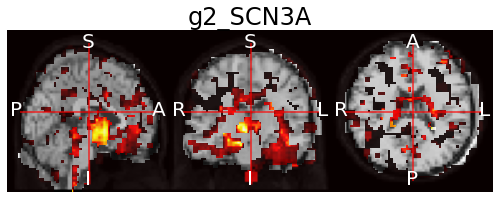

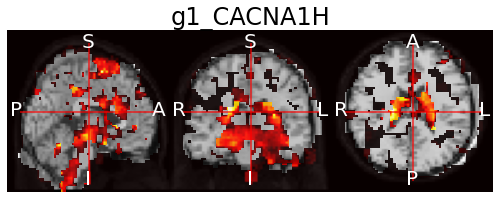

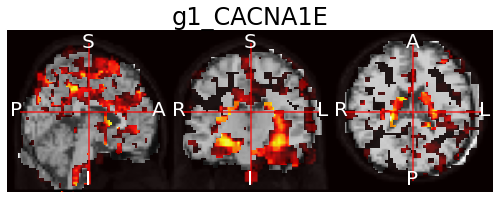

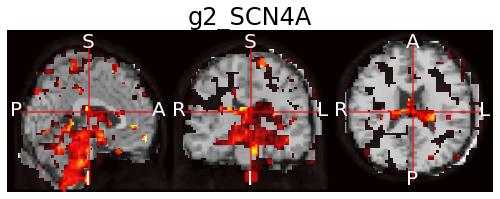

...

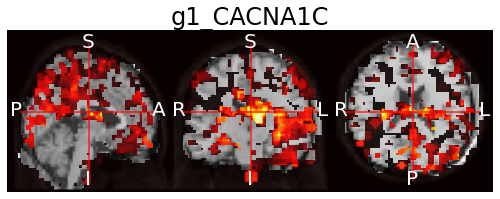

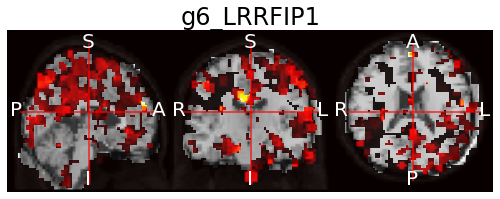

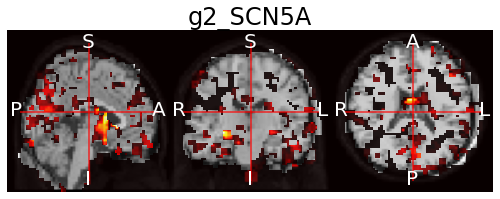

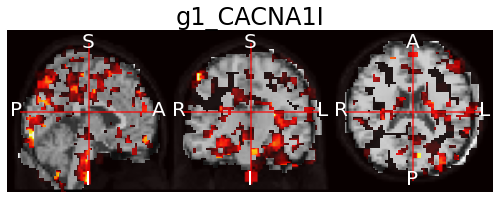

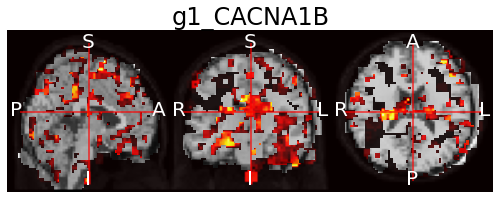

In [318]:
#for i in range(ng):
for i in ord_:
    temp.plot_ortho(genemaps[i],flat=True,overlay_cmap='hot',title=genelbls[i])

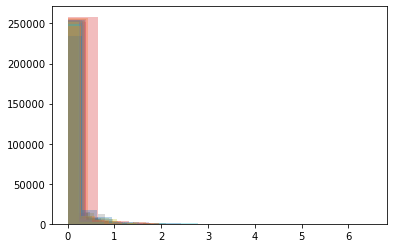

In [319]:
for i in range(ng):
    plt.hist(genemaps[i].flatten(),alpha=.3)

In [336]:
xcorr_r_threshed_nii = ims[0].new_image_like(xcorr_r_threshed.reshape((64,64,64)))
ycorr_r_threshed_nii = ims[0].new_image_like(ycorr_r_threshed.reshape((64,64,64)))

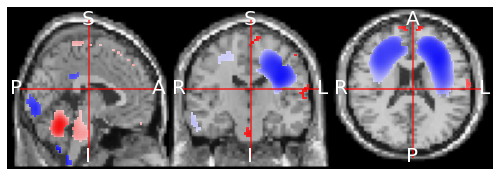

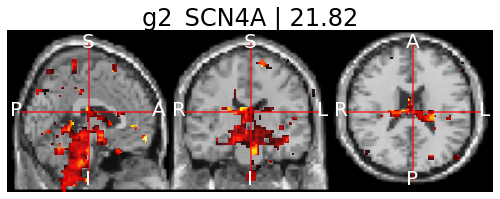

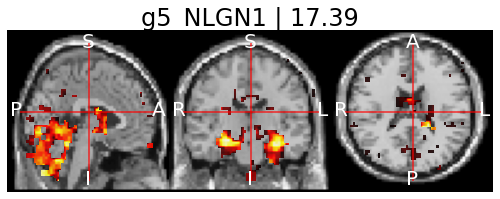

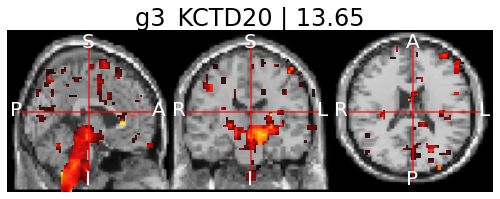

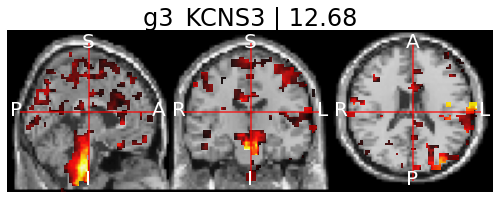

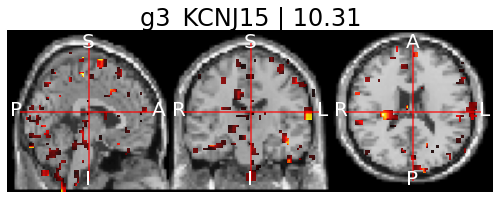

In [456]:
temp.plot_ortho(xcorr_r_threshed_nii,flat=True,overlay_cmap='bwr')
x_tvals = results_x.tvalues[0:-1:]
x_idx = np.argsort(x_tvals)[-1::-1]
for i in range(5):
    ix = x_idx[i]
    plot_map = genemaps[ix].copy()
    plot_map[plot_map<.1]=0
    temp.plot_ortho(plot_map,flat=True,overlay_cmap='hot',title=f'{genelbls[ix]} | {x_tvals[ix]:.2f}')

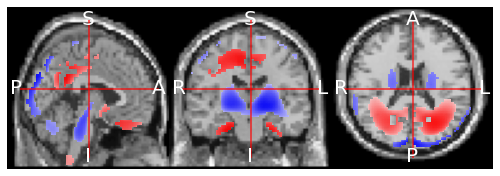

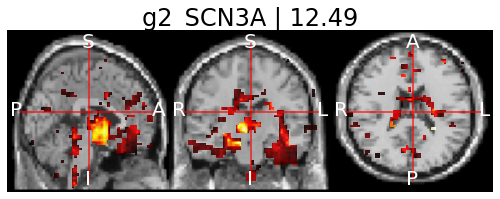

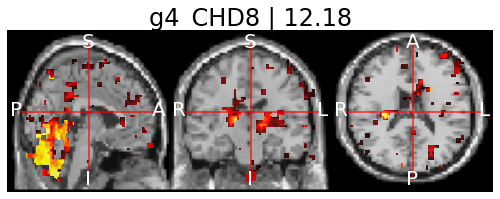

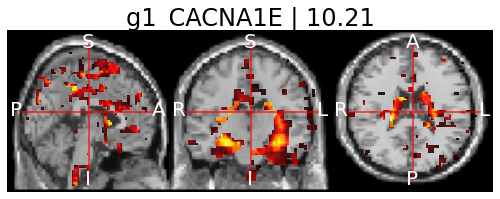

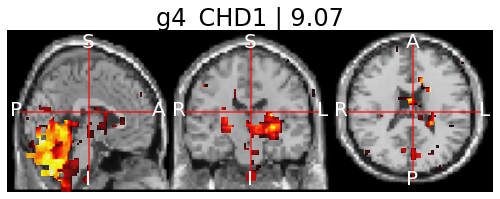

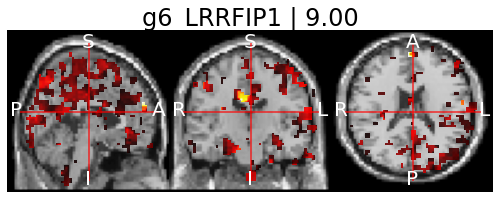

In [458]:
temp.plot_ortho(ycorr_r_threshed_nii,flat=True,overlay_cmap='bwr')
y_tvals = results_y.tvalues[0:-1:]
y_idx = np.argsort(y_tvals)[-1::-1]
#y_idx = np.argsort(y_tvals)
for i in range(5):
    iy = y_idx[i]
    plot_map = genemaps[iy].copy()
    plot_map[plot_map<.1]=0
    temp.plot_ortho(plot_map,flat=True,overlay_cmap='hot',title=f'{genelbls[iy]} | {y_tvals[iy]:.2f}')

'../../Data/asd_genemaps_top/g1_CACNA1G_top5k.nii.gz'

In [450]:
pwd

'/mmfs1/data/aglinska/BC-MRI-AE/misc/jacobian_pca'

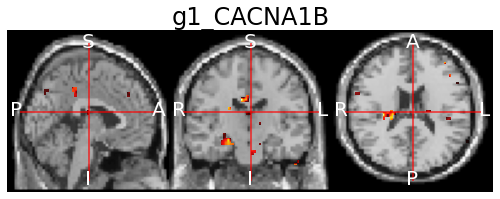

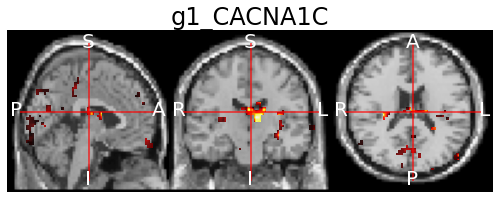

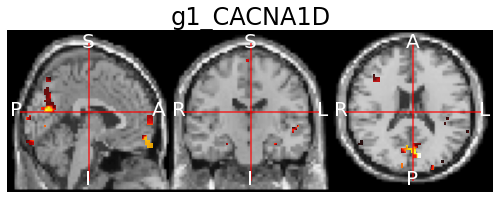

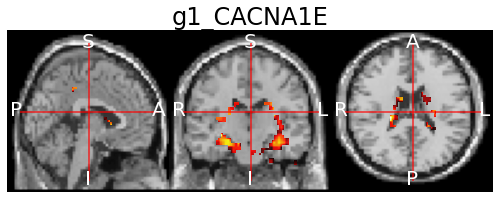

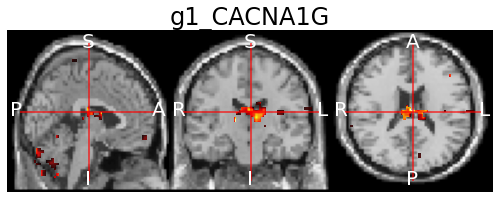

...

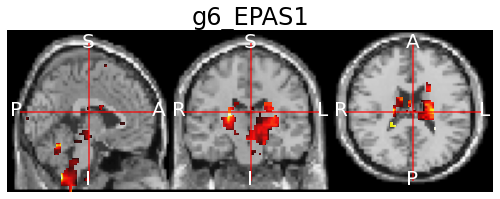

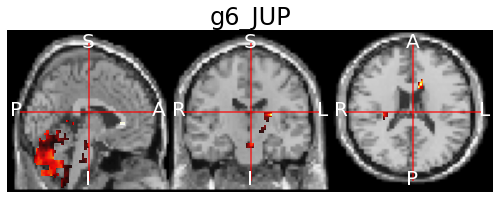

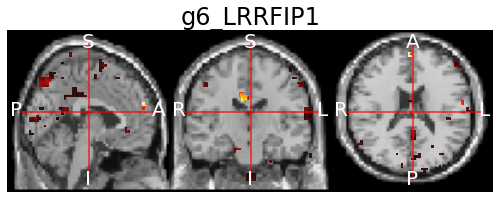

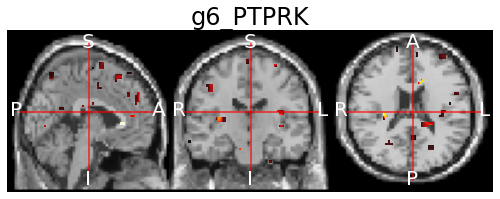

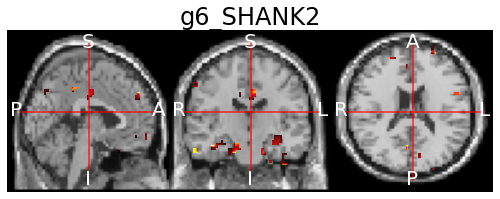

In [453]:
#for i in range(ng):
for i in range(ng):
    plot_gene = genemaps[i].copy()
    vs = np.sort(plot_gene.numpy().flatten())[-1::-1]
    plot_gene[plot_gene<vs[5000]]=0
    plot_gene.to_filename(os.path.join('../../Data/asd_genemaps_top/',genelbls[i]+'_top5k.nii.gz'))
    temp.plot_ortho(plot_gene,flat=True,overlay_cmap='hot',title=genelbls[i])

In [245]:
print(now())

2022-02-08 13:29:10.389191
